In [1]:
import os

DATA_DIR = 'C:/Users/yigii/OneDrive/Masaüstü/python_projects/portfolioprojects/gan/animefaces/animefacedataset'
print(os.listdir(DATA_DIR))

['images']


In [2]:
print(os.listdir(DATA_DIR+'/images')[:10])

['0_2000.jpg', '10000_2004.jpg', '10001_2004.jpg', '10002_2004.jpg', '10003_2004.jpg', '10004_2004.jpg', '10005_2004.jpg', '10006_2004.jpg', '10007_2004.jpg', '10008_2004.jpg']


In [3]:
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T
import numpy as np

Let's load this dataset using the ImageFolder class from torchvision. We will also resize and crop the images to 64x64 px, and normalize the pixel values with a mean & standard deviation of 0.5 for each channel. This will ensure that pixel values are in the range (-1, 1), which is more convenient for training the discriminator. We will also create a data loader to load the data in batches.

In [4]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [5]:
train_ds = ImageFolder(DATA_DIR, transform=T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor(),
    T.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

In [6]:
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

Let's create helper functions to denormalize the image tensors and display some sample images from a training batch.

In [7]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

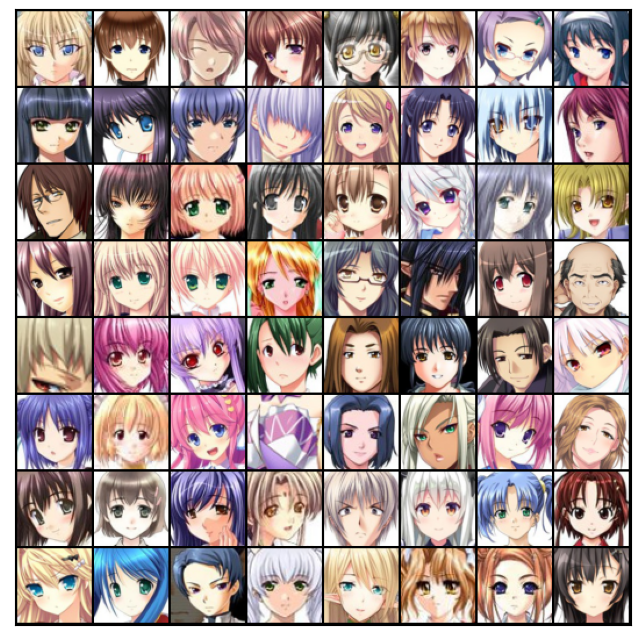

In [8]:
show_batch(train_dl)

# Using a GPU
To seamlessly use a GPU, if one is available, we define a couple of helper functions (get_default_device & to_device) and a helper class DeviceDataLoader to move our model & data to the GPU, if one is available.

In [9]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [10]:
device = get_default_device()
device

device(type='cuda')

In [11]:
train_dl = DeviceDataLoader(train_dl, device)

# Discriminator Network
The discriminator takes an image as input, and tries to classify it as "real" or "generated". In this sense, it's like any other neural network. We'll use a convolutional neural networks (CNN) which outputs a single number output for every image. We'll use stride of 2 to progressively reduce the size of the output feature map.

In [12]:
import torch.nn as nn

In [13]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64
    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

Note that we're using the $Leaky ReLU$ activation for the discriminator.

Different from the regular ReLU function, Leaky ReLU allows the pass of a small gradient signal for negative values. As a result, it makes the gradients from the discriminator flows stronger into the generator. Instead of passing a gradient (slope) of 0 in the back-prop pass, it passes a small negative gradient.

Just like any other binary classification model, the output of the discriminator is a single number between 0 and 1, which can be interpreted as the probability of the input image being real i.e. picked from the original dataset.

Let's move the discriminator model to the chosen device.

In [14]:
discriminator = to_device(discriminator, device)

# Generator Network
The input to the generator is typically a vector or a matrix of random numbers (referred to as a latent tensor) which is used as a seed for generating an image. The generator will convert a latent tensor of shape (128, 1, 1) into an image tensor of shape 3 x 28 x 28. To achive this, we'll use the ConvTranspose2d layer from PyTorch, which is performs to as a transposed convolution (also referred to as a deconvolution). 

In [15]:
latent_size = 128

In [16]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

We use the TanH activation function for the output layer of the generator.

"The ReLU activation (Nair & Hinton, 2010) is used in the generator with the exception of the output layer which uses the Tanh function. We observed that using a bounded activation allowed the model to learn more quickly to saturate and cover the color space of the training distribution. Within the discriminator we found the leaky rectified activation (Maas et al., 2013) (Xu et al., 2015) to work well, especially for higher resolution modeling." 

Note that since the outputs of the TanH activation lie in the range [-1,1], we have applied the similar transformation to the images in the training dataset. Let's generate some outputs using the generator and view them as images by transforming and denormalizing the output.

torch.Size([128, 3, 64, 64])


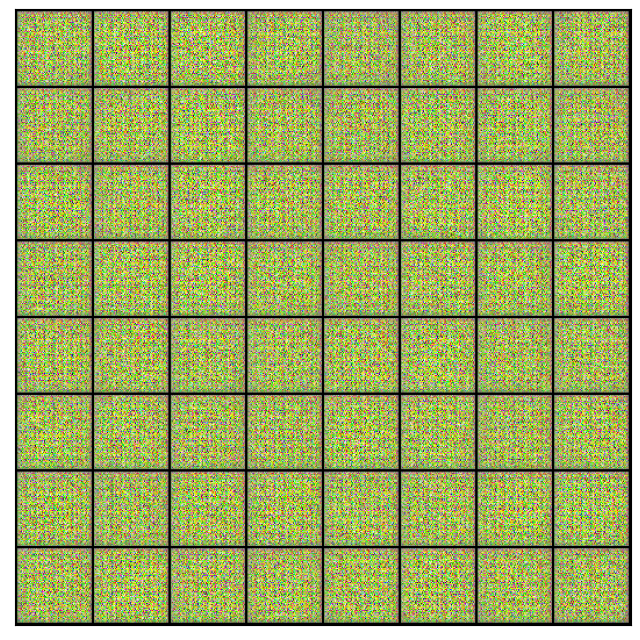

In [17]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

As one might expect, the output from the generator is basically random noise, since we haven't trained it yet.

Let's move the generator to the chosen device.

In [18]:
generator = to_device(generator, device)

# Discriminator Training
Since the discriminator is a binary classification model, we can use the binary cross entropy loss function to quantify how well it is able to differentiate between real and generated images.

In [19]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

Here are the steps involved in training the discriminator.

We expect the discriminator to output 1 if the image was picked from the real dataset, and 0 if it was generated using the generator network. 

#### 1.We first pass a batch of real images, and compute the loss, setting the target labels to 1. 

#### 2.Then we pass a batch of fake images (generated using the generator) pass them into the discriminator, and compute the loss, setting the target labels to 0. 

#### 3.Finally we add the two losses and use the overall loss to perform gradient descent to adjust the weights of the discriminator.

It's important to note that we don't change the weights of the generator model while training the discriminator (opt_d only affects the discriminator.parameters())

# Generator Training
Since the outputs of the generator are images, it's not obvious how we can train the generator. This is where we employ a rather elegant trick, which is to use the discriminator as a part of the loss function. Here's how it works:

We generate a batch of images using the generator, pass the into the discriminator.

We calculate the loss by setting the target labels to 1 i.e. real. We do this because the generator's objective is to "fool" the discriminator. 

We use the loss to perform gradient descent i.e. change the weights of the generator, so it gets better at generating real-like images to "fool" the discriminator.

Here's what this looks like in code.

In [20]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)
    
    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)
    
    # Update generator weights
    loss.backward()
    opt_g.step()
    
    return loss.item()

Let's create a directory where we can save intermediate outputs from the generator to visually inspect the progress of the model. We'll also create a helper function to export the generated images.

In [21]:
from torchvision.utils import save_image

In [22]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [23]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

We'll use a fixed set of input vectors to the generator to see how the individual generated images evolve over time as we train the model. Let's save one set of images before we start training our model.

In [24]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-0000.png


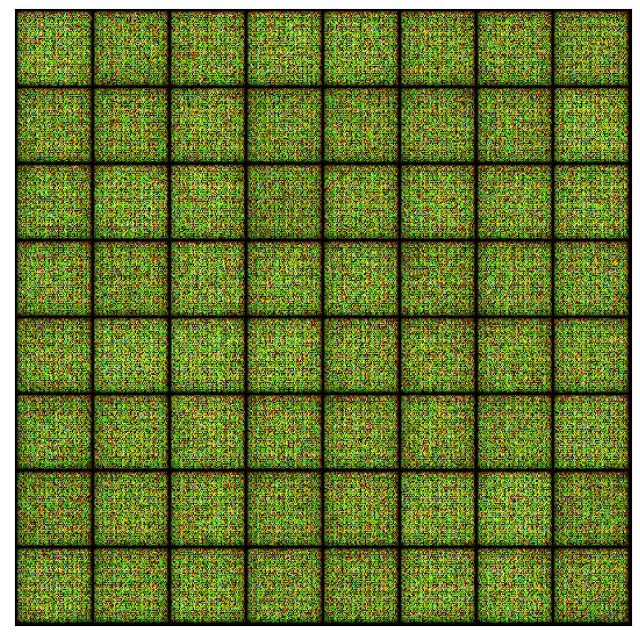

In [25]:
save_samples(0, fixed_latent)

# Full Training Loop
Let's define a fit function to train the discriminator and generator in tandem for each batch of training data. We'll use the Adam optimizer with some custom parameters (betas) that are known to work well for GANs. We will also save some sample generated images at regular intervals for inspection.

In [26]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [27]:
def fit(epochs, lr, start_idx=1, losses_g=[], losses_d=[], real_scores=[], fake_scores=[]):
    torch.cuda.empty_cache()
    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    
    for epoch in range(epochs):
        
        batch_losses_d, batch_losses_g, batch_real_scores, batch_fake_scores= [], [], [], []        
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
           
            # Train generator
            loss_g = train_generator(opt_g)
       
            batch_losses_g.append(loss_g)
            batch_losses_d.append(loss_d)
            batch_real_scores.append(real_score)
            batch_fake_scores.append(fake_score)
        

        # Record losses & scores
        losses_g.extend(batch_losses_g)
        losses_d.extend(batch_losses_d)
        
        real_scores.extend(batch_real_scores)
        fake_scores.extend(batch_fake_scores)

        
        # Calculate epoch scores
        epoch_loss_g = np.mean(losses_g[-len(batch_losses_g):])
        epoch_loss_d = np.mean(losses_d[-len(batch_losses_d):])

        
        epoch_real_score = np.mean(real_scores[-len(batch_real_scores):])
        epoch_fake_score = np.mean(fake_scores[-len(batch_fake_scores):])

        
        # Log losses & scores (last batch)
        print(f"Epoch [{ epoch+1}/{epochs}]")
        print(f'Loss_D: {epoch_loss_d:.3f}, Loss_G: {epoch_loss_g:.3f}')
        print(f'Real_Score: {real_score:.3f}, Fake_Score: {fake_score:.3f}') 
        # Save generated images
        if (epoch+start_idx) % 10 == 0:
            save_samples(epoch+start_idx, fixed_latent, show=False)
    
    return losses_g, losses_d, real_scores, fake_scores

In [28]:
lr = 0.0002
epochs = 50

In [29]:
history = fit(epochs, lr)

  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [1/50]
Loss_D: 0.586, Loss_G: 6.352
Real_Score: 0.608, Fake_Score: 0.028


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [2/50]
Loss_D: 0.586, Loss_G: 5.410
Real_Score: 0.952, Fake_Score: 0.203


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [3/50]
Loss_D: 0.474, Loss_G: 5.467
Real_Score: 0.927, Fake_Score: 0.104


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [4/50]
Loss_D: 0.385, Loss_G: 5.938
Real_Score: 0.991, Fake_Score: 0.368


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [5/50]
Loss_D: 0.330, Loss_G: 6.234
Real_Score: 0.997, Fake_Score: 0.163


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [6/50]
Loss_D: 0.367, Loss_G: 6.131
Real_Score: 0.827, Fake_Score: 0.004


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [7/50]
Loss_D: 0.324, Loss_G: 5.850
Real_Score: 0.831, Fake_Score: 0.022


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [8/50]
Loss_D: 0.322, Loss_G: 5.985
Real_Score: 0.969, Fake_Score: 0.069


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [9/50]
Loss_D: 0.339, Loss_G: 5.743
Real_Score: 0.939, Fake_Score: 0.035


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [10/50]
Loss_D: 0.302, Loss_G: 5.586
Real_Score: 0.969, Fake_Score: 0.079
Saving generated-images-0010.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [11/50]
Loss_D: 0.330, Loss_G: 5.376
Real_Score: 0.970, Fake_Score: 0.143


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [12/50]
Loss_D: 0.279, Loss_G: 5.302
Real_Score: 0.769, Fake_Score: 0.027


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [13/50]
Loss_D: 0.270, Loss_G: 5.509
Real_Score: 0.952, Fake_Score: 0.043


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [14/50]
Loss_D: 0.244, Loss_G: 5.207
Real_Score: 0.985, Fake_Score: 0.175


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [15/50]
Loss_D: 0.340, Loss_G: 5.055
Real_Score: 0.949, Fake_Score: 0.058


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [16/50]
Loss_D: 0.284, Loss_G: 4.940
Real_Score: 0.920, Fake_Score: 0.080


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [17/50]
Loss_D: 0.288, Loss_G: 4.909
Real_Score: 0.996, Fake_Score: 0.159


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [18/50]
Loss_D: 0.248, Loss_G: 4.981
Real_Score: 0.878, Fake_Score: 0.015


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [19/50]
Loss_D: 0.308, Loss_G: 5.108
Real_Score: 0.951, Fake_Score: 0.202


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [20/50]
Loss_D: 0.273, Loss_G: 4.737
Real_Score: 0.923, Fake_Score: 0.040
Saving generated-images-0020.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [21/50]
Loss_D: 0.285, Loss_G: 5.003
Real_Score: 0.989, Fake_Score: 0.125


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [22/50]
Loss_D: 0.266, Loss_G: 4.910
Real_Score: 0.991, Fake_Score: 0.125


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [23/50]
Loss_D: 0.258, Loss_G: 4.929
Real_Score: 0.858, Fake_Score: 0.027


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [24/50]
Loss_D: 0.266, Loss_G: 4.893
Real_Score: 0.953, Fake_Score: 0.018


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [25/50]
Loss_D: 0.216, Loss_G: 5.057
Real_Score: 0.913, Fake_Score: 0.011


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [26/50]
Loss_D: 0.241, Loss_G: 5.043
Real_Score: 0.945, Fake_Score: 0.066


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [27/50]
Loss_D: 0.255, Loss_G: 4.963
Real_Score: 0.938, Fake_Score: 0.044


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [28/50]
Loss_D: 0.171, Loss_G: 5.016
Real_Score: 0.982, Fake_Score: 0.011


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [29/50]
Loss_D: 0.217, Loss_G: 5.019
Real_Score: 0.965, Fake_Score: 0.021


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [30/50]
Loss_D: 0.253, Loss_G: 5.021
Real_Score: 0.988, Fake_Score: 0.011
Saving generated-images-0030.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [31/50]
Loss_D: 0.198, Loss_G: 4.978
Real_Score: 0.910, Fake_Score: 0.033


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [32/50]
Loss_D: 0.220, Loss_G: 5.091
Real_Score: 0.983, Fake_Score: 0.019


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [33/50]
Loss_D: 0.220, Loss_G: 5.058
Real_Score: 0.985, Fake_Score: 0.031


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [34/50]
Loss_D: 0.195, Loss_G: 5.031
Real_Score: 0.955, Fake_Score: 0.029


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [35/50]
Loss_D: 0.299, Loss_G: 5.001
Real_Score: 0.974, Fake_Score: 0.062


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [36/50]
Loss_D: 0.107, Loss_G: 4.980
Real_Score: 0.971, Fake_Score: 0.012


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [37/50]
Loss_D: 0.250, Loss_G: 5.105
Real_Score: 0.933, Fake_Score: 0.015


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [38/50]
Loss_D: 0.221, Loss_G: 4.883
Real_Score: 0.991, Fake_Score: 0.035


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [39/50]
Loss_D: 0.264, Loss_G: 5.016
Real_Score: 0.971, Fake_Score: 0.032


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [40/50]
Loss_D: 0.172, Loss_G: 5.013
Real_Score: 0.947, Fake_Score: 0.094
Saving generated-images-0040.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [41/50]
Loss_D: 0.201, Loss_G: 5.085
Real_Score: 0.980, Fake_Score: 0.040


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [42/50]
Loss_D: 0.174, Loss_G: 5.092
Real_Score: 0.989, Fake_Score: 0.030


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [43/50]
Loss_D: 0.188, Loss_G: 5.334
Real_Score: 0.936, Fake_Score: 0.045


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [44/50]
Loss_D: 0.177, Loss_G: 5.147
Real_Score: 0.995, Fake_Score: 0.040


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [45/50]
Loss_D: 0.185, Loss_G: 5.195
Real_Score: 0.935, Fake_Score: 0.027


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [46/50]
Loss_D: 0.235, Loss_G: 4.962
Real_Score: 0.993, Fake_Score: 0.020


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [47/50]
Loss_D: 0.180, Loss_G: 5.199
Real_Score: 0.997, Fake_Score: 0.474


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [48/50]
Loss_D: 0.206, Loss_G: 5.178
Real_Score: 0.940, Fake_Score: 0.045


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [49/50]
Loss_D: 0.080, Loss_G: 5.258
Real_Score: 0.990, Fake_Score: 0.009


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [50/50]
Loss_D: 0.194, Loss_G: 5.395
Real_Score: 0.891, Fake_Score: 0.033
Saving generated-images-0050.png


In [45]:
history = fit(50, lr, start_idx=51, losses_g=losses_g, losses_d=losses_d, real_scores=real_scores, fake_scores=fake_scores)
losses_g, losses_d, real_scores, fake_scores = history

  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [1/50]
Loss_D: 0.164, Loss_G: 5.582
Real_Score: 0.949, Fake_Score: 0.045


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [2/50]
Loss_D: 0.193, Loss_G: 5.149
Real_Score: 0.949, Fake_Score: 0.006


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [3/50]
Loss_D: 0.241, Loss_G: 5.072
Real_Score: 0.928, Fake_Score: 0.042


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [4/50]
Loss_D: 0.176, Loss_G: 5.311
Real_Score: 0.929, Fake_Score: 0.091


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [5/50]
Loss_D: 0.118, Loss_G: 5.357
Real_Score: 0.963, Fake_Score: 0.005


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [6/50]
Loss_D: 0.035, Loss_G: 5.741
Real_Score: 0.987, Fake_Score: 0.014


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [7/50]
Loss_D: 0.211, Loss_G: 5.515
Real_Score: 0.998, Fake_Score: 0.086


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [8/50]
Loss_D: 0.262, Loss_G: 5.111
Real_Score: 0.994, Fake_Score: 0.024


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [9/50]
Loss_D: 0.039, Loss_G: 5.668
Real_Score: 0.973, Fake_Score: 0.008


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [10/50]
Loss_D: 0.253, Loss_G: 5.274
Real_Score: 0.973, Fake_Score: 0.012
Saving generated-images-0060.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [11/50]
Loss_D: 0.220, Loss_G: 5.237
Real_Score: 0.996, Fake_Score: 0.188


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [12/50]
Loss_D: 0.198, Loss_G: 5.205
Real_Score: 0.983, Fake_Score: 0.023


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [13/50]
Loss_D: 0.075, Loss_G: 5.557
Real_Score: 0.992, Fake_Score: 0.039


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [14/50]
Loss_D: 0.092, Loss_G: 5.809
Real_Score: 0.991, Fake_Score: 0.010


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [15/50]
Loss_D: 0.245, Loss_G: 5.388
Real_Score: 0.940, Fake_Score: 0.011


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [16/50]
Loss_D: 0.113, Loss_G: 5.548
Real_Score: 0.939, Fake_Score: 0.104


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [17/50]
Loss_D: 0.179, Loss_G: 5.456
Real_Score: 0.970, Fake_Score: 0.021


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [18/50]
Loss_D: 0.140, Loss_G: 5.425
Real_Score: 0.980, Fake_Score: 0.019


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [19/50]
Loss_D: 0.132, Loss_G: 5.563
Real_Score: 0.977, Fake_Score: 0.004


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [20/50]
Loss_D: 0.201, Loss_G: 5.593
Real_Score: 0.966, Fake_Score: 0.012
Saving generated-images-0070.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [21/50]
Loss_D: 0.192, Loss_G: 5.336
Real_Score: 0.987, Fake_Score: 0.010


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [22/50]
Loss_D: 0.080, Loss_G: 5.768
Real_Score: 0.970, Fake_Score: 0.007


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [23/50]
Loss_D: 0.198, Loss_G: 5.403
Real_Score: 0.963, Fake_Score: 0.003


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [24/50]
Loss_D: 0.111, Loss_G: 5.617
Real_Score: 0.996, Fake_Score: 0.025


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [25/50]
Loss_D: 0.116, Loss_G: 5.887
Real_Score: 0.979, Fake_Score: 0.045


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [26/50]
Loss_D: 0.186, Loss_G: 5.516
Real_Score: 0.774, Fake_Score: 0.003


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [27/50]
Loss_D: 0.191, Loss_G: 5.422
Real_Score: 0.969, Fake_Score: 0.004


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [28/50]
Loss_D: 0.101, Loss_G: 5.696
Real_Score: 0.925, Fake_Score: 0.007


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [29/50]
Loss_D: 0.149, Loss_G: 5.672
Real_Score: 0.954, Fake_Score: 0.134


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [30/50]
Loss_D: 0.148, Loss_G: 5.552
Real_Score: 0.979, Fake_Score: 0.014
Saving generated-images-0080.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [31/50]
Loss_D: 0.152, Loss_G: 5.550
Real_Score: 1.000, Fake_Score: 0.684


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [32/50]
Loss_D: 0.108, Loss_G: 5.643
Real_Score: 0.986, Fake_Score: 0.010


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [33/50]
Loss_D: 0.194, Loss_G: 5.792
Real_Score: 0.984, Fake_Score: 0.025


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [34/50]
Loss_D: 0.133, Loss_G: 6.020
Real_Score: 0.903, Fake_Score: 0.113


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [35/50]
Loss_D: 0.147, Loss_G: 5.570
Real_Score: 0.990, Fake_Score: 0.004


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [36/50]
Loss_D: 0.131, Loss_G: 5.915
Real_Score: 0.999, Fake_Score: 0.828


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [37/50]
Loss_D: 0.134, Loss_G: 5.584
Real_Score: 0.998, Fake_Score: 0.024


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [38/50]
Loss_D: 0.056, Loss_G: 6.134
Real_Score: 0.981, Fake_Score: 0.009


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [39/50]
Loss_D: 0.196, Loss_G: 5.778
Real_Score: 0.984, Fake_Score: 0.015


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [40/50]
Loss_D: 0.071, Loss_G: 6.133
Real_Score: 0.548, Fake_Score: 0.043
Saving generated-images-0090.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [41/50]
Loss_D: 0.185, Loss_G: 5.643
Real_Score: 0.918, Fake_Score: 0.084


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [42/50]
Loss_D: 0.199, Loss_G: 5.457
Real_Score: 0.992, Fake_Score: 0.052


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [43/50]
Loss_D: 0.031, Loss_G: 6.111
Real_Score: 0.993, Fake_Score: 0.014


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [44/50]
Loss_D: 0.203, Loss_G: 5.674
Real_Score: 0.969, Fake_Score: 0.032


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [45/50]
Loss_D: 0.144, Loss_G: 5.423
Real_Score: 0.996, Fake_Score: 0.044


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [46/50]
Loss_D: 0.177, Loss_G: 5.528
Real_Score: 0.988, Fake_Score: 0.081


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [47/50]
Loss_D: 0.033, Loss_G: 6.061
Real_Score: 0.994, Fake_Score: 0.007


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [48/50]
Loss_D: 0.021, Loss_G: 6.495
Real_Score: 0.980, Fake_Score: 0.007


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [49/50]
Loss_D: 1.943, Loss_G: 5.865
Real_Score: 0.972, Fake_Score: 0.011


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [50/50]
Loss_D: 0.210, Loss_G: 5.545
Real_Score: 0.989, Fake_Score: 0.017
Saving generated-images-0100.png


In [30]:
losses_g, losses_d, real_scores, fake_scores = history

In [31]:
import pandas as pd

def plot_results(dist1, dist2, title, window_size1=len(train_dl), window_size2=len(train_dl)):
    x1 = np.arange(0, len(dist1), 1)
    x2 = np.arange(0, len(dist2), 1)
    
    fig, ax = plt.subplots(figsize=(10,6))
    
    # Calculate the rolling means for each distribution
    rolling_mean1 = pd.Series(dist1).rolling(window=window_size1).mean()
    rolling_mean2 = pd.Series(dist2).rolling(window=window_size2).mean()
    
    # Plot the distributions with shading between rolling means
    ax.fill_between(x1, dist1, rolling_mean1, alpha=0.3, label='Real', color='blue')
    ax.fill_between(x2, dist2, rolling_mean2, alpha=0.3, label='Fake', color='orange')

    # Plot the rolling means as lines
    ax.plot(x1, rolling_mean1, label='Moving Mean Real', color='blue')
    ax.plot(x2, rolling_mean2, label='Moving Mean Fake', color='orange')

    # Customize the plot
    ax.set_xlabel('Time')
    ax.set_ylabel('Value')
    ax.set_title(title)
    ax.legend()

    # Show the plot
    plt.show()    

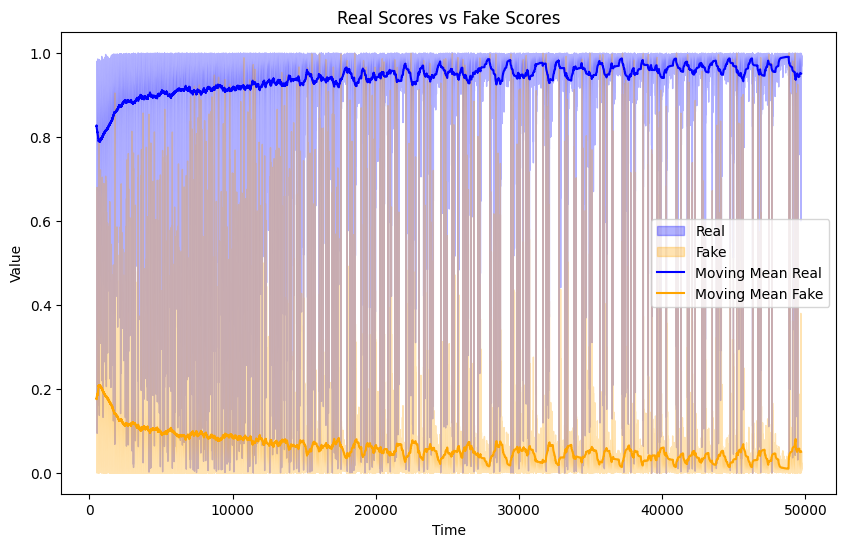

In [46]:
plot_results(real_scores, fake_scores, 'Real Scores vs Fake Scores')

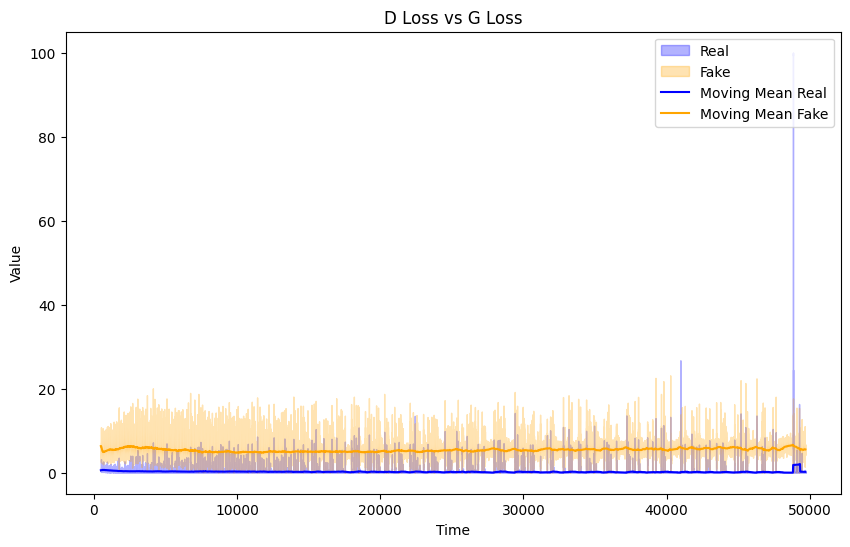

In [47]:
plot_results(losses_d, losses_g, 'D Loss vs G Loss')

In [36]:
# Save the model checkpoints 
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

In [37]:
from IPython.display import Image

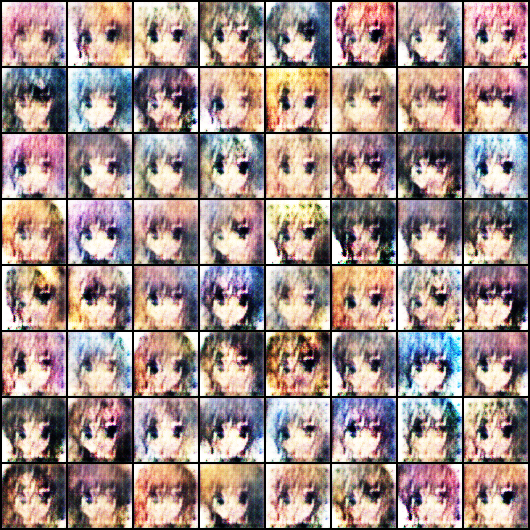

In [38]:
Image('./generated/generated-images-0001.png')

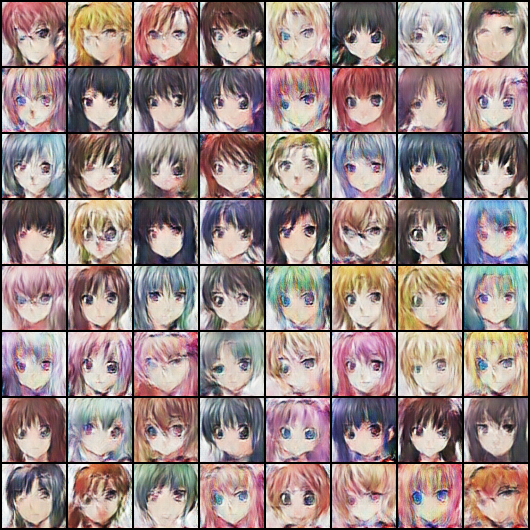

In [49]:
Image('./generated/generated-images-0010.png')

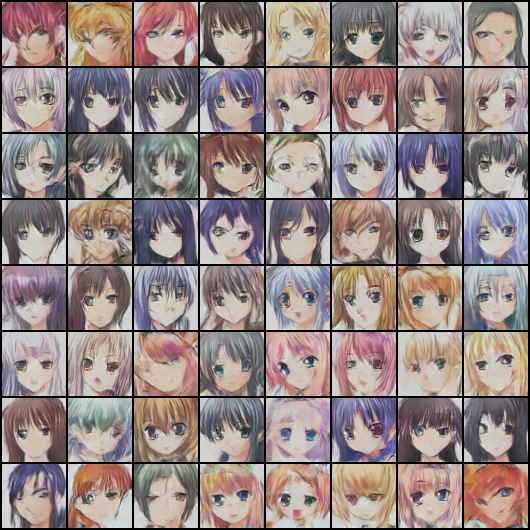

In [50]:
Image('./generated/generated-images-0020.png')

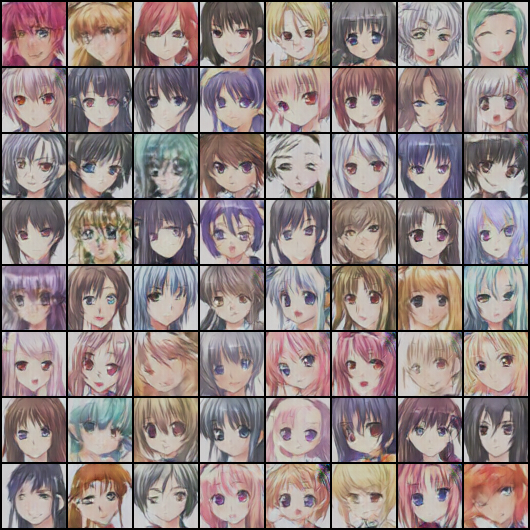

In [51]:
Image('./generated/generated-images-0050.png')

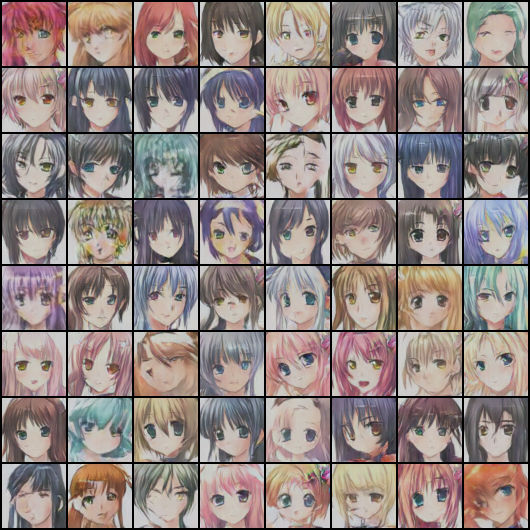

In [52]:
Image('./generated/generated-images-0070.png')

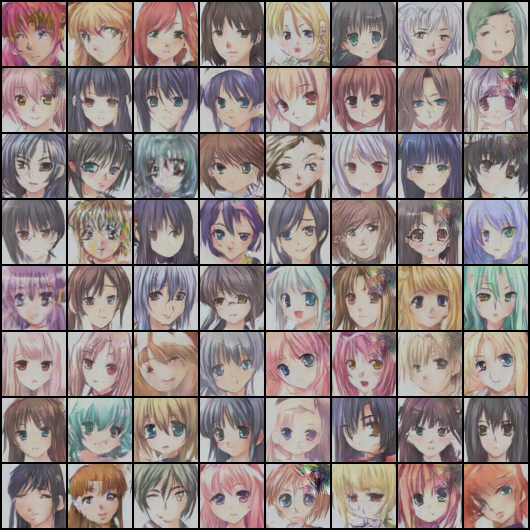

In [48]:
Image('./generated/generated-images-0090.png')

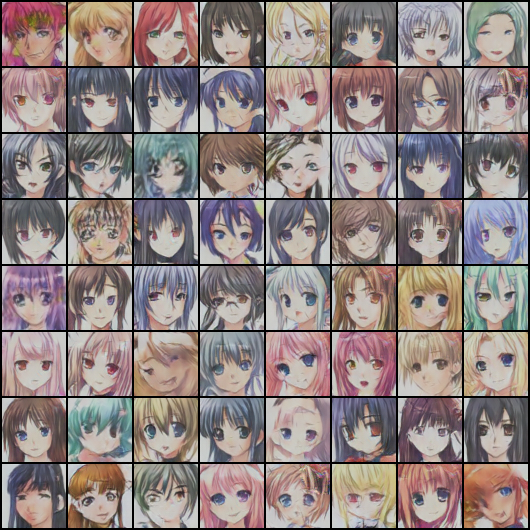

In [54]:
Image('./generated/generated-images-0100.png')

In [61]:
import cv2
import os

vid_fname = 'gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

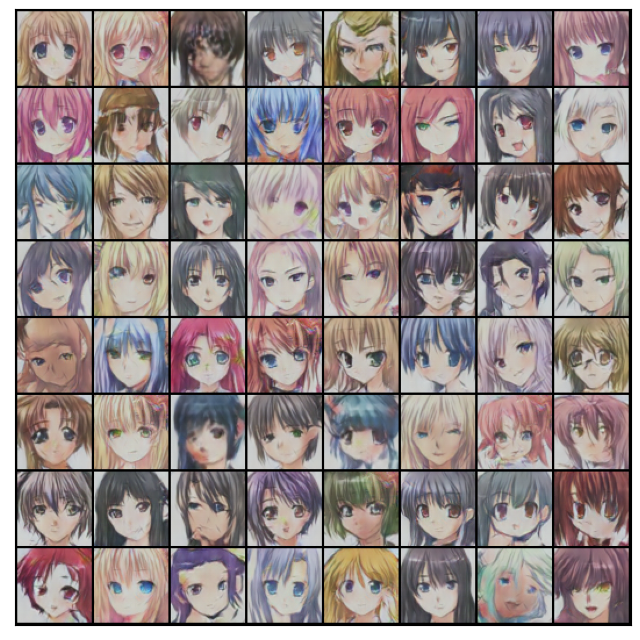

In [62]:
new_latent = torch.randn(64, latent_size, 1, 1, device=device)

fake_images = denorm(generator(new_latent))
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

tensor([[8.5544e-11]], device='cuda:0', grad_fn=<SigmoidBackward0>)


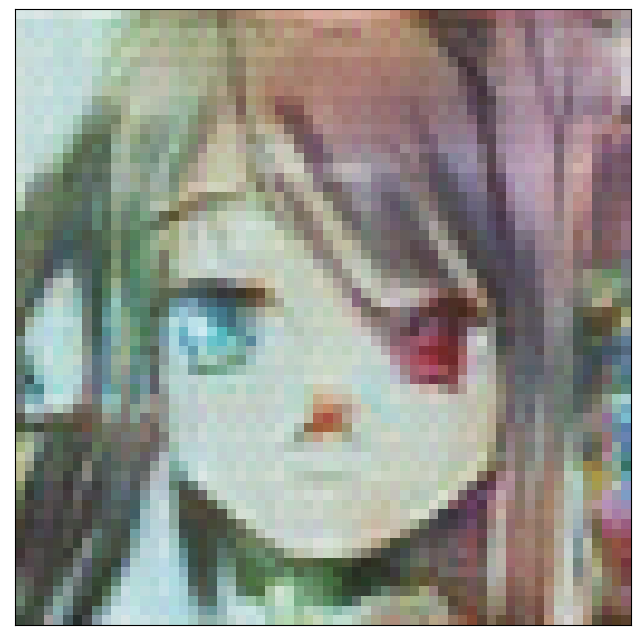

In [60]:
new_latent = torch.randn(1, latent_size, 1, 1, device=device)
fake_images = denorm(generator(new_latent))
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))
print(discriminator(generator(new_latent)))